In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import h5py
import pickle as pkl
%matplotlib inline

import sys
import os

os.chdir('..')
sys.path.append(os.getcwd())

import evaluation
import datasets
import features

## Train the PCA on foredeck

In [3]:
fd_pca = evaluation.visualization.train_pca_on_foredeck('features/foredeck/foredeck.h5',
                                                        'features/foredeck/trained_pca.pkl')

Found 440 rows with missing values.
Original shape: (463977, 10)
Shape after drop: (463933, 10)
Foredeck variance explained by first two components: 68.36%


In [4]:
with h5py.File('features/foredeck/foredeck.h5', 'r') as hf:
    fd = np.array(hf.get('X'))
    
fd_proj = evaluation.visualization.foredeck_projection(fd, fd_pca)
x_fd, y_fd = fd_proj.T

Found 440 rows with missing values.
Original shape: (463977, 10)
Shape after drop: (463933, 10)


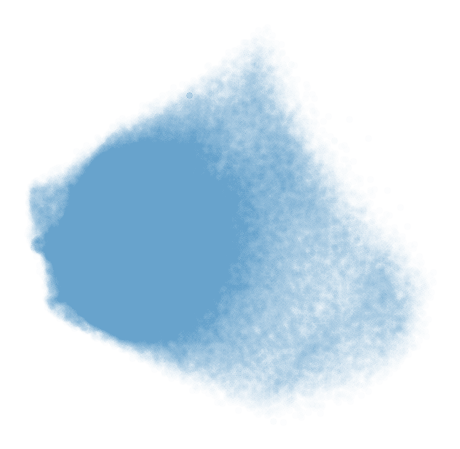

In [5]:
plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.axis('off');

## Project 14k real samples on foredeck space

In [6]:
feats_14k = features.get('14k')
proj_14k = evaluation.visualization.foredeck_projection(feats_14k, fd_pca)
x_14k, y_14k = proj_14k.T

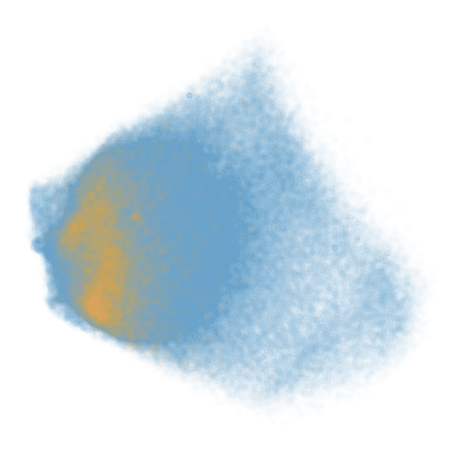

In [7]:
plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_14k, y_14k, alpha=0.01)
ax.axis('off');

## Project 4k (undersampled) on foredeck space

## Project GAN trained on 14k

In [8]:
feats_vanilla_14k = features.get('vanilla_lstm_large_14k', 3)
proj_v_14k = evaluation.visualization.foredeck_projection(feats_vanilla_14k, fd_pca)
x_v_14k, y_v_14k = proj_v_14k.T

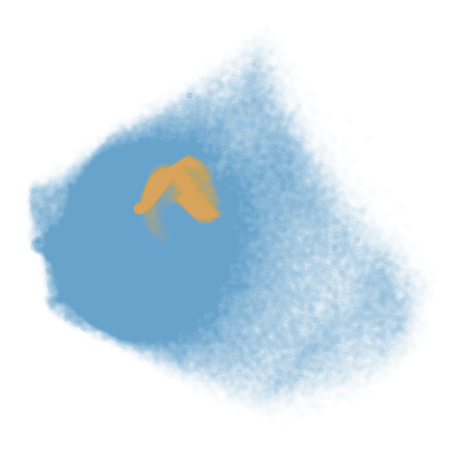

In [9]:
plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_v_14k, y_v_14k, alpha=0.01)
ax.axis('off');

## GAN trained on 14k [OLD]

## Project GAN trained on 4k [WRONG]

In [10]:
feats_v_4k = features.get('vanilla_lstm_large_4k', 23)
proj_v_4k = evaluation.visualization.foredeck_projection(feats_v_4k, fd_pca)
x_v_1k, y_v_4k = proj_v_4k.T

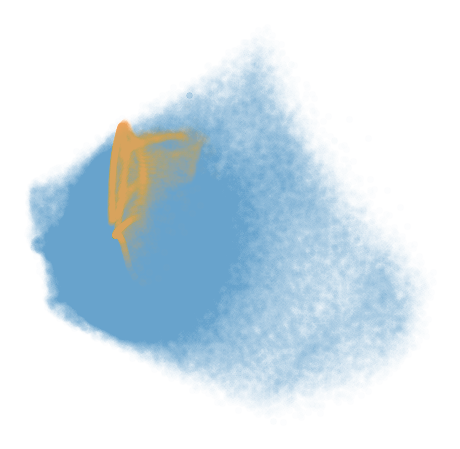

In [11]:
plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_v_1k, y_v_4k, alpha=0.01)
ax.axis('off');

## Project cGAN (v1) trained on 14k

In [12]:
feats_cgan = features.get('vanilla_lstm_large_cgan_14k', 0)
proj_cgan = evaluation.visualization.foredeck_projection(feats_cgan, fd_pca)
x_cgan, y_cgan = proj_cgan.T

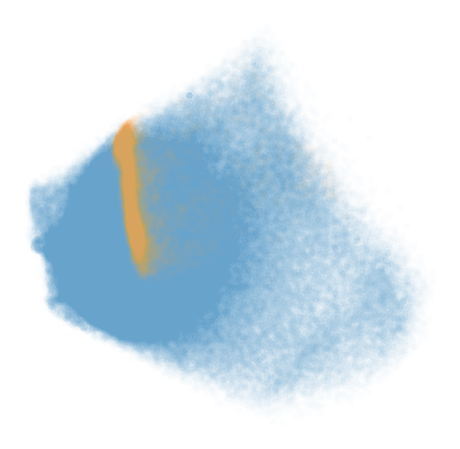

In [13]:
plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_cgan, y_cgan, alpha=0.01)
ax.axis('off');

## Project cGAN (v2) trained on 14k

In [14]:
feats_cgan2 = features.get('vanilla_lstm_large_cgan_2_14k', 9)
proj_cgan2 = evaluation.visualization.foredeck_projection(feats_cgan2, fd_pca)
x_cgan2, y_cgan2 = proj_cgan2.T

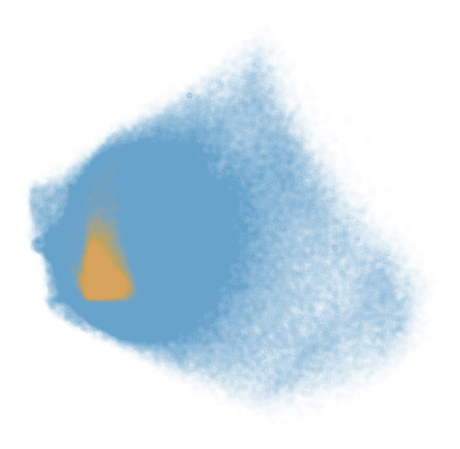

In [15]:
plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_cgan2, y_cgan2, alpha=0.01)
ax.axis('off');

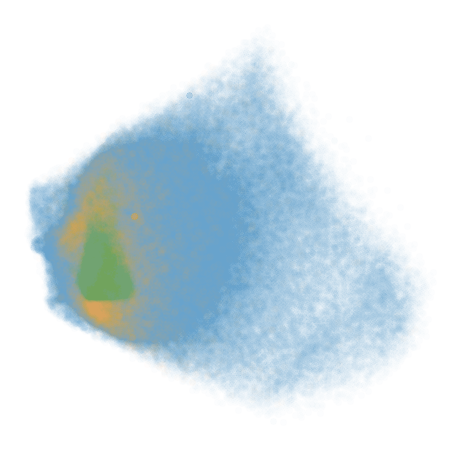

In [19]:
plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_14k, y_14k, alpha=0.01)
ax.scatter(x_cgan2, y_cgan2, alpha=0.01)
ax.axis('off');

## Comparative

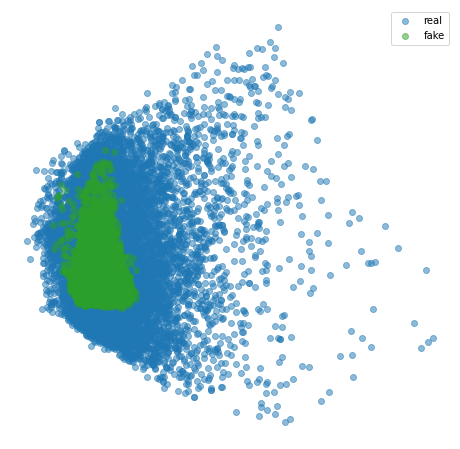

In [16]:
evaluation.visualization.scatterplot((proj_14k, proj_cgan2));

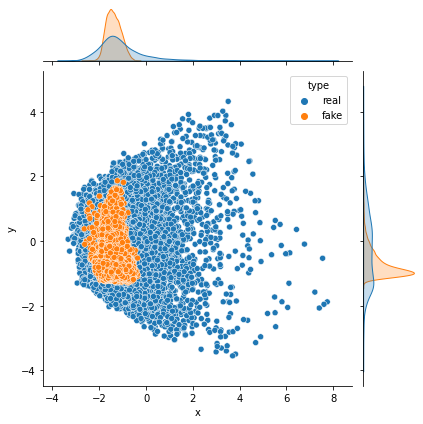

In [17]:
evaluation.visualization.jointplot((proj_14k, proj_cgan2));

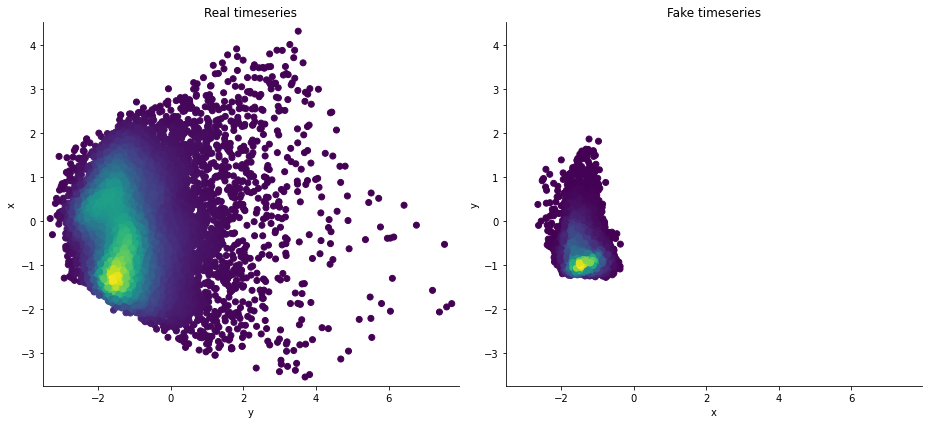

In [18]:
evaluation.visualization.densityplot((proj_14k, proj_cgan2));

## Progression

In [58]:
def get_proj_async(name='vanilla_lstm_large_cgan_2_14k', epoch=0):
    while epoch < 50:
        try:
            feats = features.get(name, epoch)
        except OSError:
            time.sleep(15)
            continue
        proj = evaluation.visualization.foredeck_projection(feats, fd_pca)
        epoch += 1
        yield proj, epoch
    
def plot_vs_dataset(x, y, epoch):
    plt.figure(figsize=(8, 8))

    ax = plt.subplot(111)
    ax.scatter(x_fd, y_fd, alpha=0.01)
    ax.scatter(x_14k, y_14k, alpha=0.01)
    ax.scatter(x, y, alpha=0.01)
    ax.set_title('Epoch ' + str(epoch))
    ax.axis('off')
    
loader = get_proj_async()

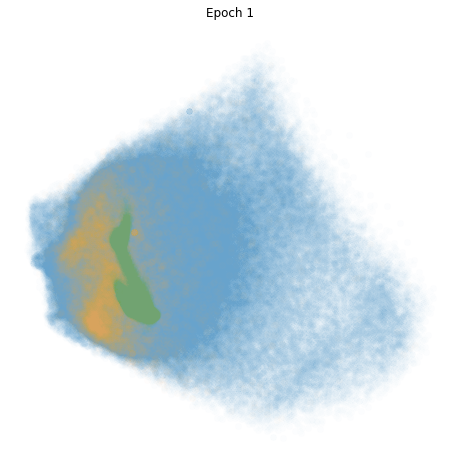

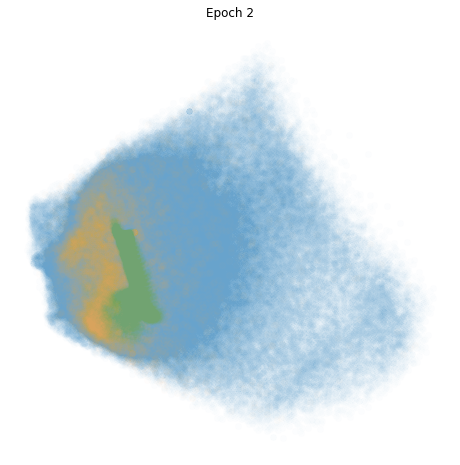

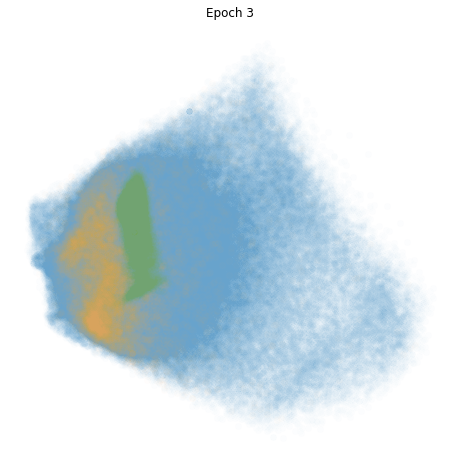

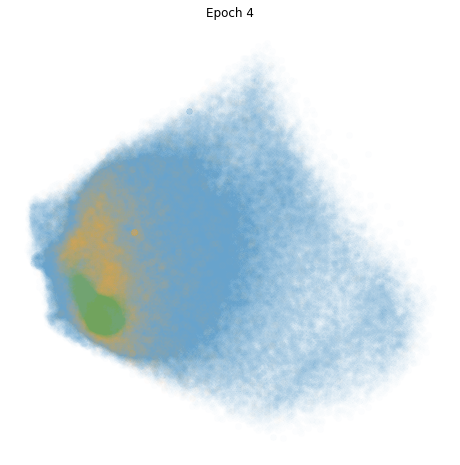

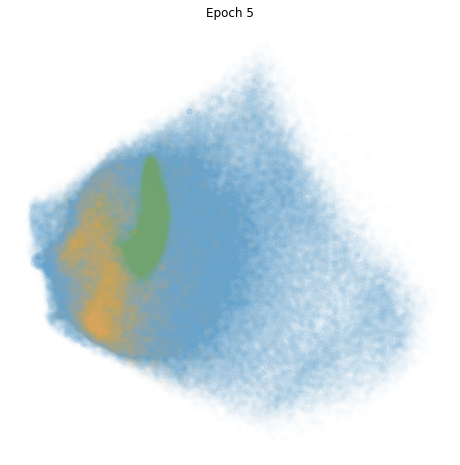

...

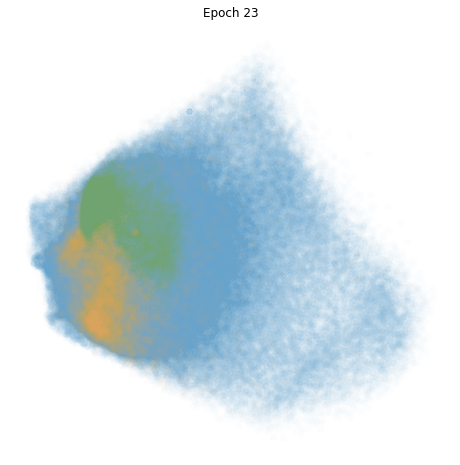

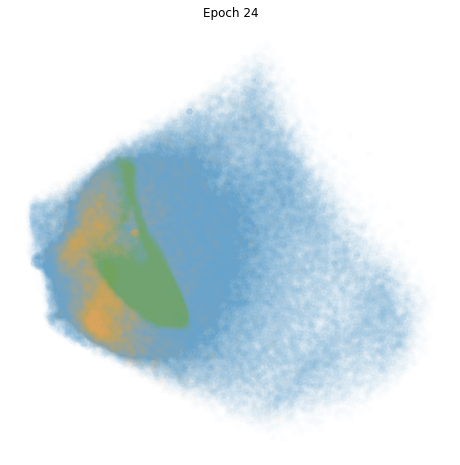

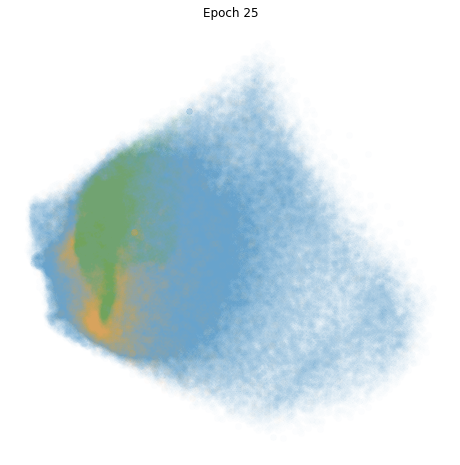

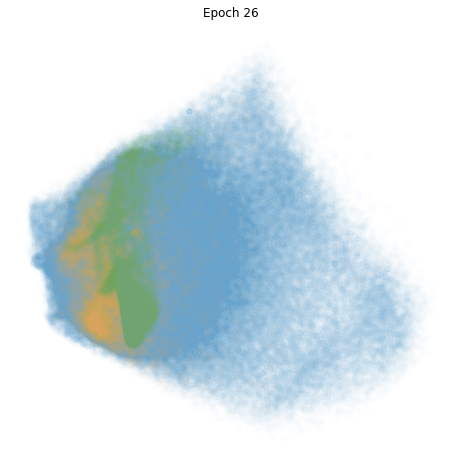

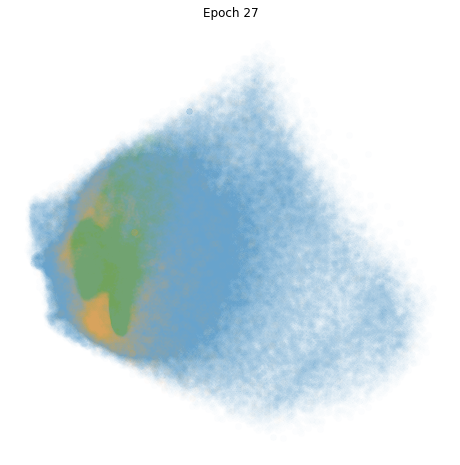

Found 10 rows with missing values.
Original shape: (14242, 10)
Shape after drop: (14241, 10)


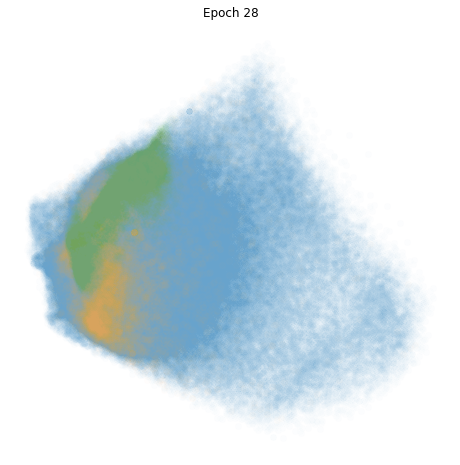

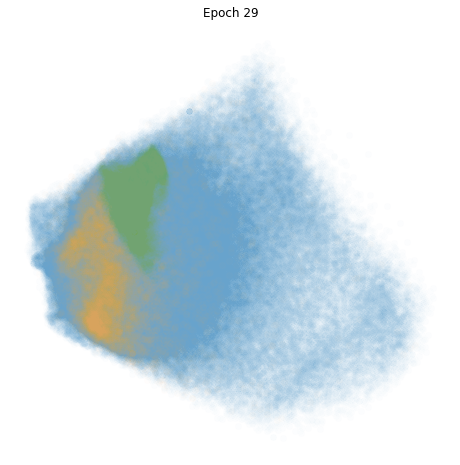

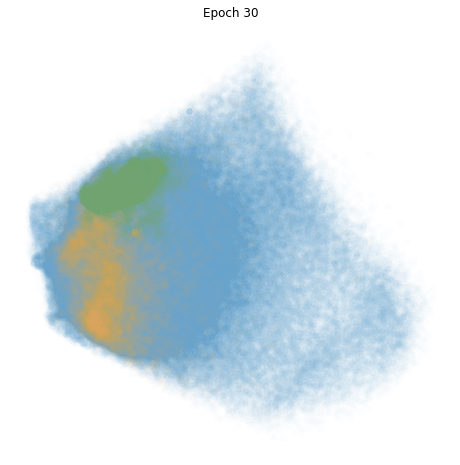

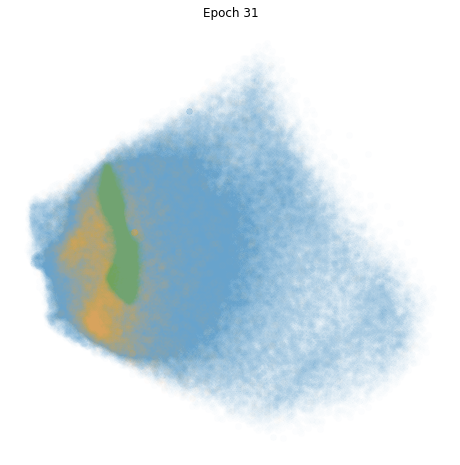

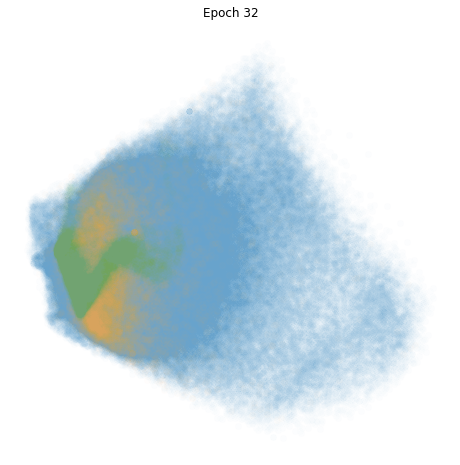

...

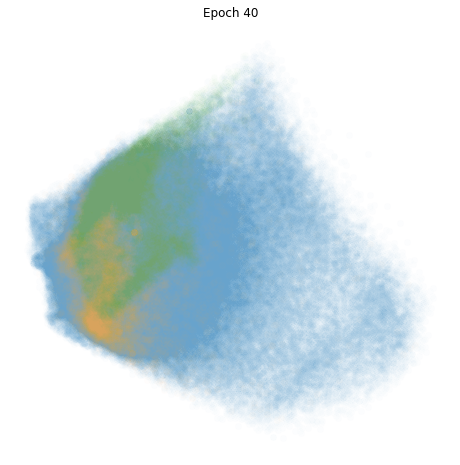

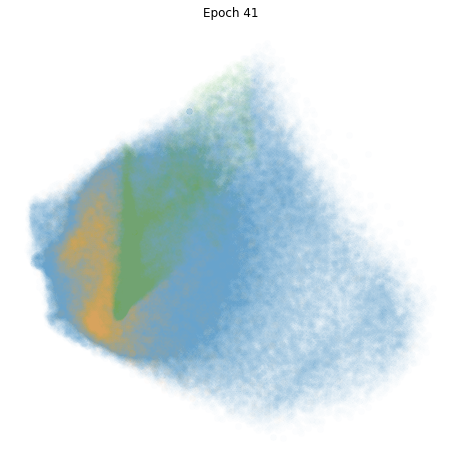

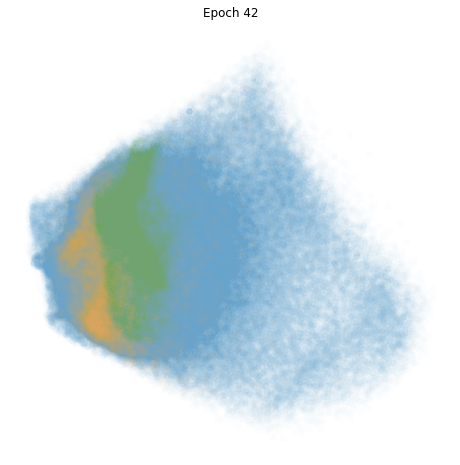

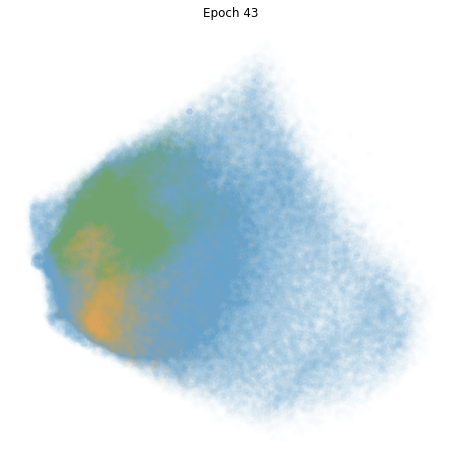

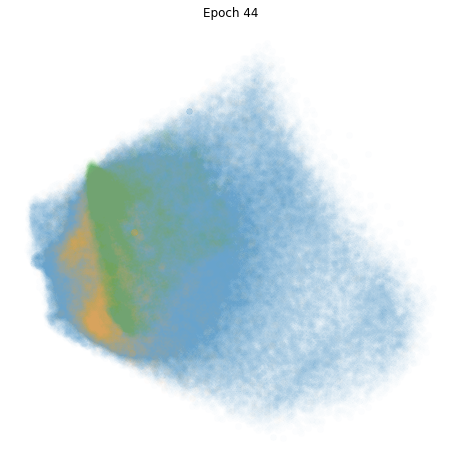

Found 180 rows with missing values.
Original shape: (14242, 10)
Shape after drop: (14224, 10)


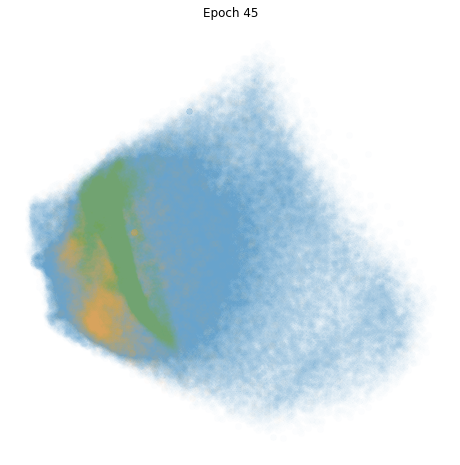

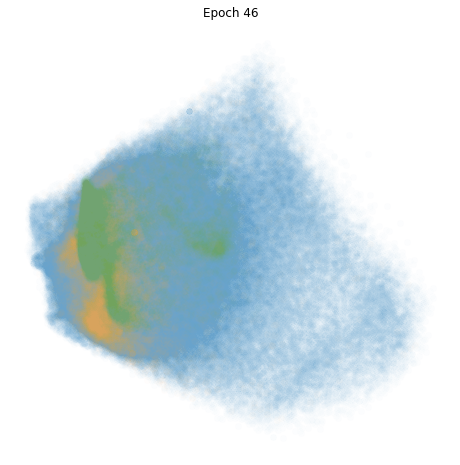

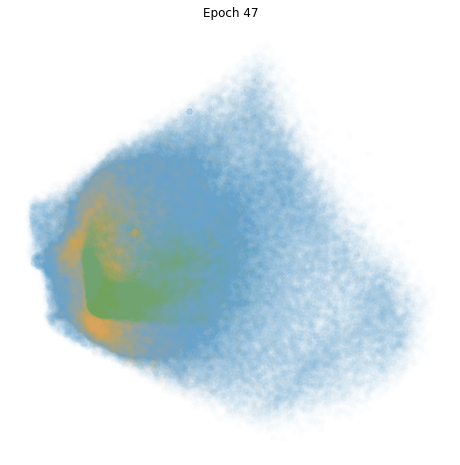

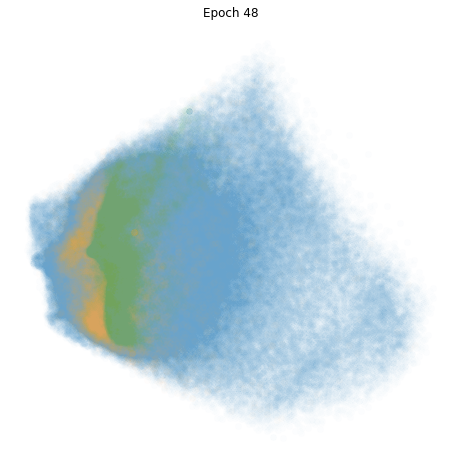

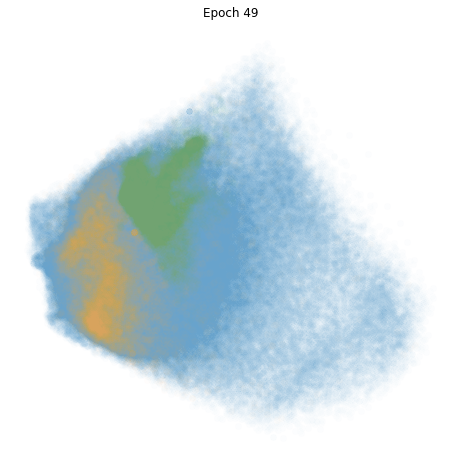

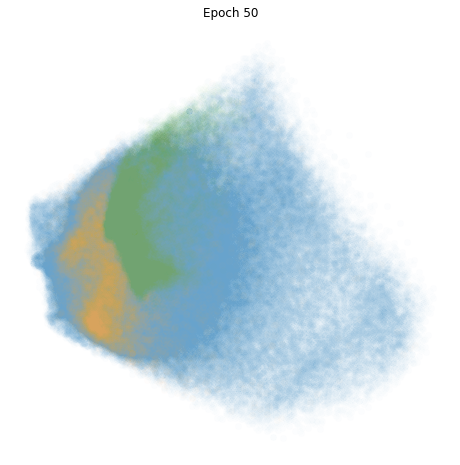

StopIteration: 

In [59]:
projections = []

while True:
    p, e = next(loader)
    x, y = p.T
    projections.append(p)
    plot_vs_dataset(x, y, e)
    plt.show()  

## Across training samples

In [89]:
def load_samples(model_name, epoch):
    
    samples_dir = 'samples/{}/'.format(model_name)
    
    samples_file = str(samples_dir + 'samples_epoch_{}.h5'.format(epoch))

    with h5py.File(samples_file, 'r') as hf:
        x = np.array(hf.get('X'))
        
    return x

def random_selection(samples, num=1000):
    ind = np.random.permutation(len(samples))[:num]
    return samples[ind]

In [76]:
samples_across = [random_selection(load_samples('vanilla_lstm_large_cgan_2_14k', epoch)) for epoch in range(50)]
samples_across = np.vstack(samples_across)
samples_across.shape

(50000, 24)

In [79]:
features_across = features.extraction.extract_R_features(samples_across)

Calling 'Spaces.R'


(-4.1865637174576245, 8.881799225082181, -4.379623096737189, 5.259266784458252)

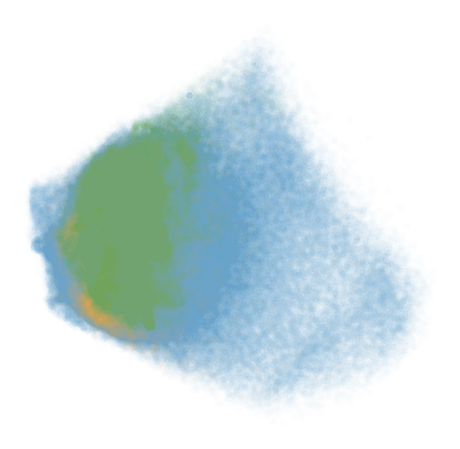

In [82]:
proj_across = evaluation.visualization.foredeck_projection(features_across, fd_pca)
x_a, y_a = proj_across.T

plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_14k, y_14k, alpha=0.01)
ax.scatter(x_a, y_a, alpha=0.01)
ax.axis('off')

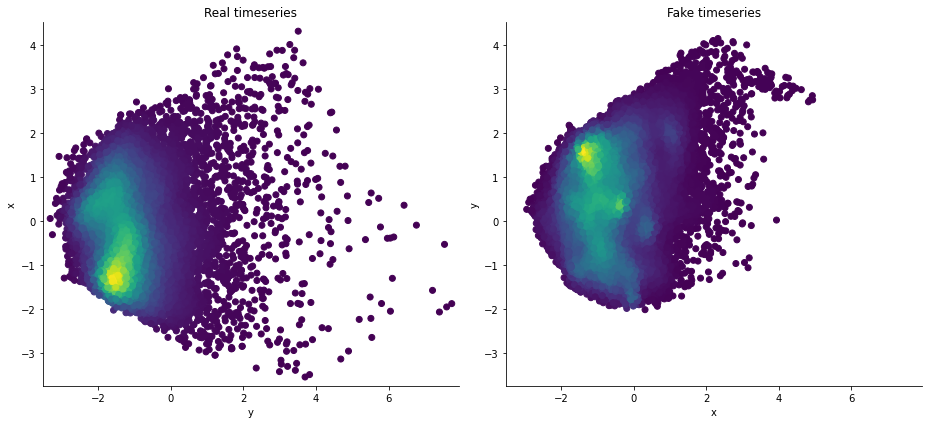

In [83]:
evaluation.visualization.densityplot((proj_14k, proj_across));

In [90]:
samples_across = [random_selection(load_samples('vanilla_lstm_large_cgan_2_14k', epoch), num=285) for epoch in range(50)]
samples_across = np.vstack(samples_across)
samples_across.shape

(14250, 24)

In [91]:
np.save('samples/vanilla_lstm_large_cgan_2_14k/all_epochs.npy', samples_across)

In [92]:
features_across_2 = features.extraction.extract_R_features(samples_across)

Calling 'Spaces.R'


(-4.1865637174576245, 8.881799225082181, -4.379623096737189, 5.259266784458252)

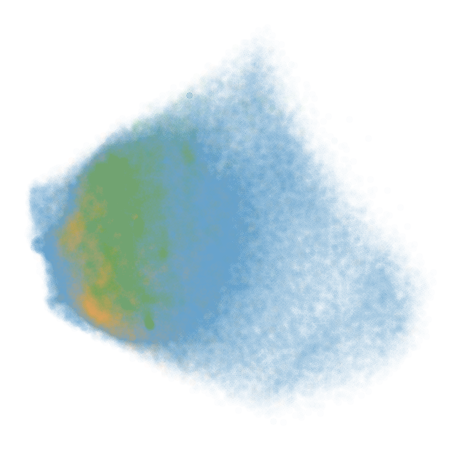

In [93]:
proj_across = evaluation.visualization.foredeck_projection(features_across_2, fd_pca)
x_a, y_a = proj_across.T

plt.figure(figsize=(8, 8))

ax = plt.subplot(111)
ax.scatter(x_fd, y_fd, alpha=0.01)
ax.scatter(x_14k, y_14k, alpha=0.01)
ax.scatter(x_a, y_a, alpha=0.01)
ax.axis('off')

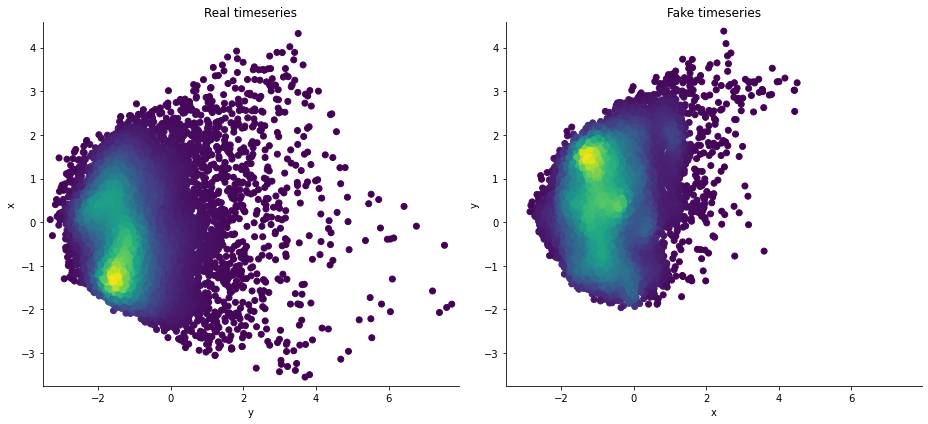

In [94]:
evaluation.visualization.densityplot((proj_14k, proj_across));